In [5]:
using Images, FileIO, OffsetArrays, DelimitedFiles, LinearAlgebra, Colors

## In this notebok we will visually see how some of the functions of the module work and what results they give.

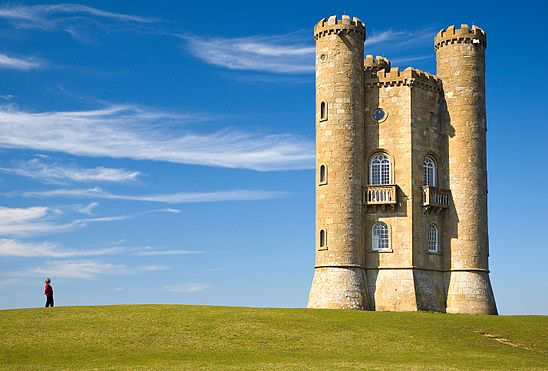

In [14]:
image = (load("./images/seam_carving.jpg"))

In [15]:
include("SC_bb.jl")
aux = SC_bb.initialize_aux(image');

In [20]:
SC_bb.get_energy(aux)
intensity_gradient=aux.intensity_gradient';

To convert to a RGB, I need all values to be inside 0-1, I Hence divide for the maximum value

In [21]:
intensity_gradient_norm = intensity_gradient/maximum(intensity_gradient);

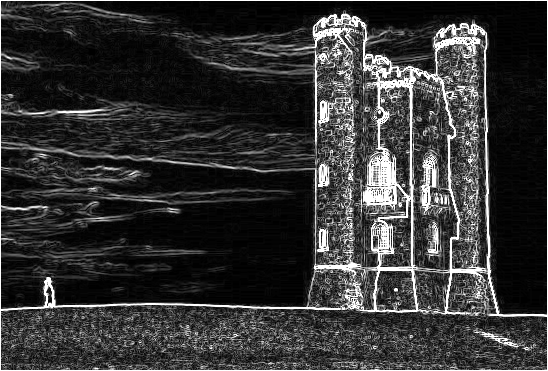

In [22]:
imgg=Gray.(intensity_gradient)

As we can see, regions with lower information(sky regions) have intensity gradeint close to 0 as we would expect.

In [23]:
SC_bb.get_seam(aux)
aux_energy=aux.aux_energy
moves=aux.moves;

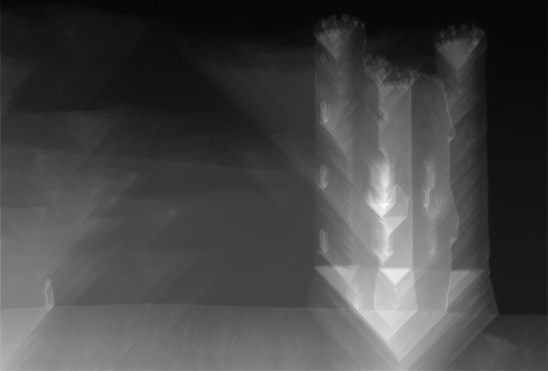

In [30]:
normalizer = maximum(aux_energy[1:end-1,:])
Gray.(aux_energy[1:end-1,:]'./normalizer)

As we can see from here, seams that areable to avoid the castle and remain in regions of sky/grass have lower energy! Logically they are the ones that we'd like to eliminate.

In [33]:
to_plot=float(moves'.+1)/2.0;

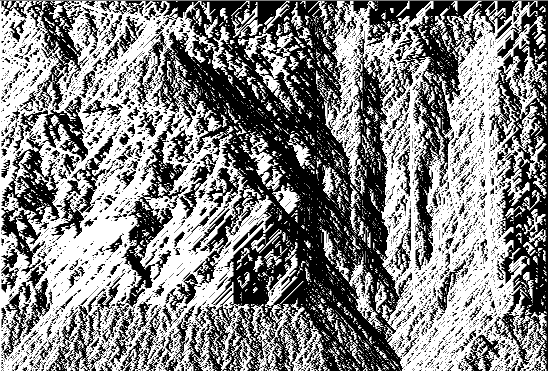

In [34]:
Gray.(to_plot)

## Let us see if now how the module works.

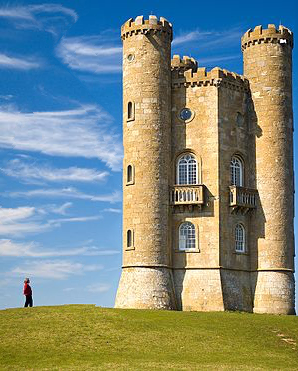

In [36]:
image = (load("./images/seam_carving.jpg"))
aux = SC_bb.initialize_aux(image');
SC_bb.seam_carve(aux,250)

## Now let us move to the testing the adaptive part of the module.

In [37]:
image = (load("./images/seam_carving.jpg"))
##Here I do not have to give to the initialize aux the transpose image, I can just give the original one
aux=SC_bb.initialize_aux(image);

ada_steps: 1
K:1
res: rows
δ: 0


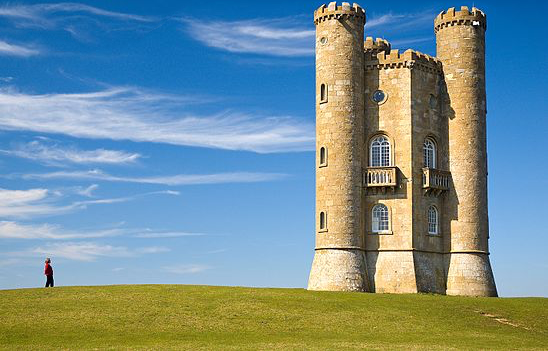

In [81]:
img1=SC_bb.ada_seam_carve(aux,20)';

ada_steps: 2
K:1
res: rows
K:2
res: rows
δ: 0


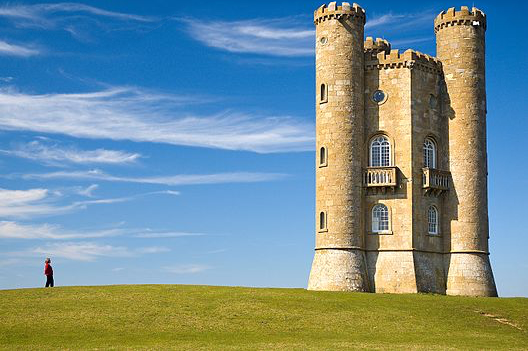

In [82]:
image = (load("./images/seam_carving.jpg"))
aux=SC_bb.initialize_aux(image)
img2=SC_bb.ada_seam_carve(aux,40)

ada_steps: 3
K:1
res: rows
K:2
res: rows
K:3
res: cols
δ: 0


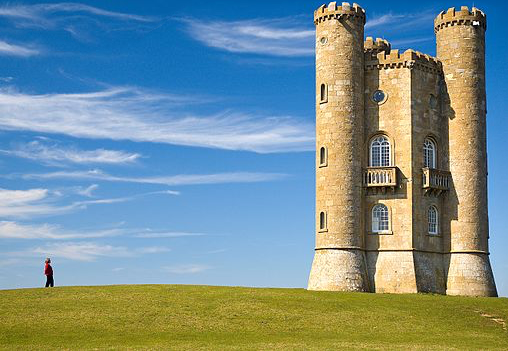

In [83]:
image = (load("./images/seam_carving.jpg"))
aux=SC_bb.initialize_aux(image)
img3=SC_bb.ada_seam_carve(aux,60)

ada_steps: 4
K:1
res: rows
K:2
res: rows
K:3
res: cols
K:4
res: rows
δ: 0


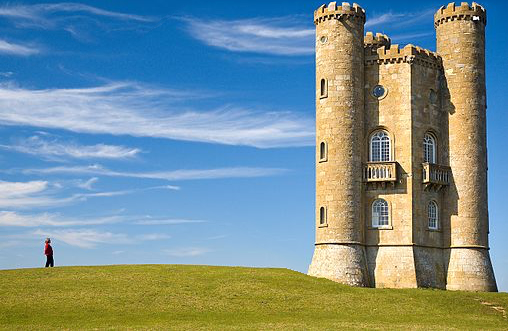

In [86]:
image = (load("./images/seam_carving.jpg"))
aux=SC_bb.initialize_aux(image)
img4=SC_bb.ada_seam_carve(aux,80)'

ada_steps: 5
K:1
res: rows
K:2
res: rows
K:3
res: cols
K:4
res: rows
K:5
res: rows
δ: 0


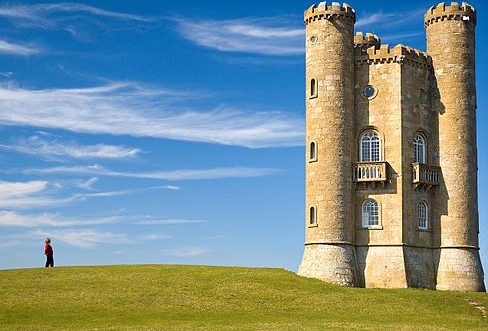

In [98]:
image = (load("./images/seam_carving.jpg"))
aux=SC_bb.initialize_aux(image)
img5=SC_bb.ada_seam_carve(aux,100)

ada_steps: 6
K:1
res: rows
K:2
res: rows
K:3
res: cols
K:4
res: rows
K:5
res: rows
K:6
res: cols
δ: 0


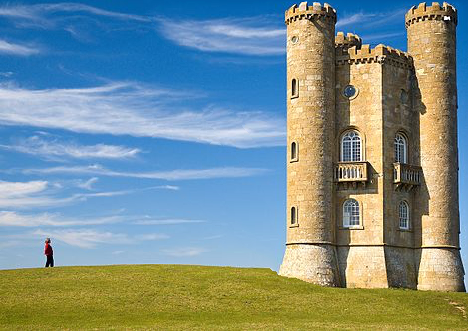

In [100]:
image = (load("./images/seam_carving.jpg"))
aux=SC_bb.initialize_aux(image)
img6=SC_bb.ada_seam_carve(aux,120)

ada_steps: 7
K:1
res: rows
K:2
res: rows
K:3
res: cols
K:4
res: rows
K:5
res: rows
K:6
res: cols
K:7
res: cols
δ: 0


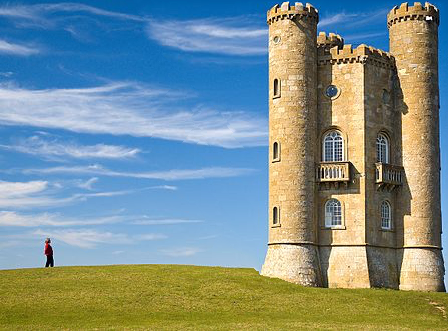

In [101]:
image = (load("./images/seam_carving.jpg"))
aux=SC_bb.initialize_aux(image)
img7=SC_bb.ada_seam_carve(aux,140)

ada_steps: 8
K:1
res: rows
K:2
res: rows
K:3
res: cols
K:4
res: rows
K:5
res: rows
K:6
res: cols
K:7
res: cols
K:8
res: rows
δ: 0


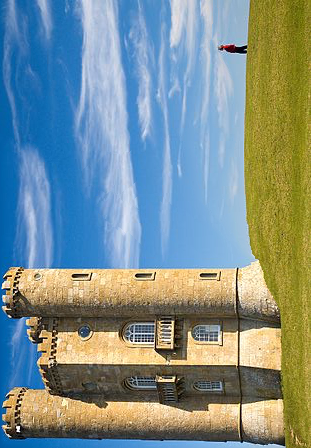

In [102]:
image = (load("./images/seam_carving.jpg"))
aux=SC_bb.initialize_aux(image)
img8=SC_bb.ada_seam_carve(aux,160)

ada_steps: 9
K:1
res: rows
K:2
res: rows
K:3
res: cols
K:4
res: rows
K:5
res: rows
K:6
res: cols
K:7
res: cols
K:8
res: rows
K:9
res: rows
δ: 0


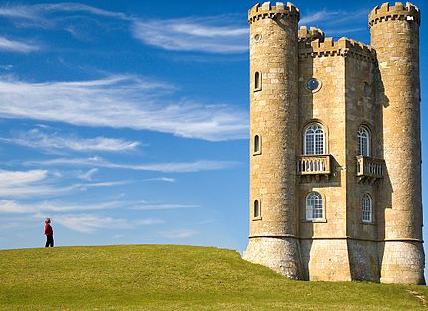

In [103]:
image = (load("./images/seam_carving.jpg"))
aux=SC_bb.initialize_aux(image)
img9=SC_bb.ada_seam_carve(aux,180)

In [129]:
p1 = plot(img1, title="Adaptive choice: remove 20 rows", titlefontsize=10)
p2 = plot(img2, title="Adaptive choice: remove 20 rows",titlefontsize=10)
p3 = plot(img3, title="Adaptive choice: remove 20 columns",titlefontsize=10)
p4 = plot(img4, title="Adaptive choice: remove 20 rows",titlefontsize=10)
p5 = plot(img5, title="Adaptive choice: remove 20 rows",titlefontsize=10)
p6 = plot(img6, title="Adaptive choice: remove 20 columns",titlefontsize=10)
p7 = plot(img7, title="Adaptive choice: remove 20 columns",titlefontsize=10)
p8 = plot(img8', title="Adaptive choice: remove 20 rows",titlefontsize=10)
p9 = plot(img9, title="Adaptive choice: remove 20 rows",titlefontsize=10)

fig=plot(p1,p2,p3,p4,p5,p6,p7,p8,p9,layout=(3,3),legend=false,size=(1000,1000))

In [38]:
#savefig(fig, "adaptive_seam_carve.pdf")